In [15]:
import pandas as pd
import numpy as np
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import pandas_profiling
import matplotlib.dates as mdates

## The datasets
>The data comes from [ClimateBC](http://climatebc.ca/) and [ClimateNA](http://climatena.ca/), two websites provided by Dr. Wang, a Professor in the Forestry Department at UBC in Vancouver. The websites provides tools to downscale meorological data from the PRISM climate group to observe long term and short term trends in the climate. With this, it is possible to choose any location in North America and receive highly detailed climate data for that location dating back to 1901.
The data is very extensive, so the difficulty lays in choosing which variables to observe and compare over time. For my project - determining the signs of climate change in ski resorts, it fits perfectly. By obtaining climate data for the location of several ski resorts in coastal and continental regions, I will be able to follow climatic trends that those regions are experiencing. Specifically the measurements {PAS - precipitation as snow} will prove useful in showing important developments for the ski resorts. Additionally, it is certainly helpful to compare the average temperature and the degree-days below 0°C {DD<0} to detect any major trends in the data. The degree-days below °C note how many days multiplied by how many degrees below freezing have occured in the measured timeline.
I expect to see an observable decline in precipitation as snow on the coastal ski resorts since those have been particularly affected by climate change.The changes in average temperature will also indicate if major changes have occured in the investigated locations. However, I also don't expect to see too many changes, potentially not even clearly destinguishable trends in the continental ski resorts. Some of the continental resorts might even show an improvement in ski conditions because climate change induced changes can even increase snowfall for continental locations for now.

## This dataset

>The dataset analyzed in this notebook covers data from Whistler Blackcomb, the enormous resort in British Columbia just north of Vancouver.
The code used to clean, slice, visualize and compare the data will work for data of all other ski resorts that are to be analyzed in the future as well. Hopefully, I will get to add many more in the course of this project.

In [17]:
# exploring dataframe for a specific location
# key to important variables is in (..\data\raw\README.md)
df = pd.read_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\raw\ClimateData_Whistler.csv')
df

,Lat,long,elev,period,MAT,MWMT,MCMT,TD,MAP,MSP,...,RH(03),RH(04),RH(05),RH(06),RH(07),RH(08),RH(09),RH(10),RH(11),RH(12)
0,50.1038,-122.9136,1480,year_1901,2.4,12.3,-6.2,18.5,1557,356,...,68,67,63,64,65,60,66,69,76,75
1,50.1038,-122.9136,1480,year_1902,1.8,10.6,-5.9,16.6,1649,335,...,70,66,65,58,65,61,62,67,73,75
2,50.1038,-122.9136,1480,year_1903,1.7,10.4,-4.4,14.8,1565,601,...,59,67,62,61,69,70,75,67,70,74
3,50.1038,-122.9136,1480,year_1904,2.4,11.1,-4.6,15.8,1448,269,...,68,62,61,58,60,57,61,71,70,77
4,50.1038,-122.9136,1480,year_1905,2.2,11.9,-4.9,16.9,1268,485,...,69,59,58,60,60,65,72,66,67,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,50.1038,-122.9136,1480,year_2015,4.3,12.3,-3.5,15.8,1298,330,...,78,73,62,61,71,72,78,78,78,83
115,50.1038,-122.9136,1480,year_2016,3.6,12.1,-6.6,18.8,1589,328,...,78,70,66,69,77,72,77,85,87,87
116,50.1038,-122.9136,1480,year_2017,3.0,13.4,-4.9,18.3,1405,174,...,84,78,66,66,69,69,74,78,85,86
117,50.1038,-122.9136,1480,year_2018,3.4,12.6,-3.5,16.2,1472,347,...,77,74,64,72,68,73,80,73,82,89


In [9]:
df.head()
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Lat,119.0,50.103800,7.135472e-14,50.1038,50.1038,50.1038,50.1038,50.1038
long,119.0,-122.913600,1.141675e-13,-122.9136,-122.9136,-122.9136,-122.9136,-122.9136
elev,119.0,1480.000000,0.000000e+00,1480.0000,1480.0000,1480.0000,1480.0000,1480.0000
MAT,119.0,2.215126,7.839101e-01,-0.1000,1.7000,2.2000,2.7000,4.3000
MWMT,119.0,11.423529,1.013528e+00,8.7000,10.7000,11.5000,11.9500,13.8000
...,...,...,...,...,...,...,...,...
RH(08),119.0,69.025210,4.386926e+00,57.0000,66.0000,69.0000,72.0000,80.0000
RH(09),119.0,71.521008,4.644751e+00,58.0000,68.0000,71.0000,74.0000,82.0000
RH(10),119.0,74.092437,4.286343e+00,62.0000,72.0000,74.0000,77.0000,85.0000
RH(11),119.0,75.941176,4.407801e+00,67.0000,73.0000,75.0000,78.0000,87.0000


In [8]:
# exploring the dataframe
df
df.iloc[:,20:50]
df.iloc[:,50:80]
df.iloc[:,80:110]
df.iloc[:,110:140]
df.iloc[:,140:170]
df.iloc[:,170:200]
df.iloc[:,200:230]

,NFFD(10),NFFD(11),NFFD(12),PAS(01),PAS(02),PAS(03),PAS(04),PAS(05),PAS(06),PAS(07),...,Eref(06),Eref(07),Eref(08),Eref(09),Eref(10),Eref(11),Eref(12),CMD(01),CMD(02),CMD(03)
0,15,7,3,161,139,83,92,19,20,2,...,81,91,92,49,28,0,0,0,0,0
1,10,2,1,99,163,214,63,42,6,3,...,92,89,85,52,27,0,0,0,0,0
2,10,3,4,113,34,136,50,37,2,3,...,99,84,73,40,27,0,0,0,0,0
3,13,7,3,125,209,239,48,24,5,1,...,93,103,92,56,26,13,0,0,0,0
4,3,3,2,80,61,73,45,33,3,1,...,96,106,79,44,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,20,4,4,40,49,43,27,1,0,0,...,105,91,73,39,24,0,0,0,0,0
115,16,11,1,96,70,122,2,9,5,2,...,82,76,76,42,17,8,0,0,0,0
116,14,6,5,55,169,191,100,17,2,0,...,86,95,83,47,22,0,0,0,0,0
117,13,9,4,100,98,87,50,2,7,0,...,74,96,73,37,24,9,0,0,0,0


> There are 4 descriptive, categorical varialbes (columns), 23 annual variables, 14 seasonal variables for each of the 4 season (total 56 columns) and 14 monthly variables for each of the 12 months (total 168 columns) for a total of 251 columns over 119 years (observations from 1901 to 2019). This describes all the historical datasets in the correct order that will be investigated

> It seems like there is something wrong with the Radiation data (negative radiation).
The data assumes the Value **-9999.0** instead of **NaN** as null value. 
The majority of values is invalid, hence I will probably drop the column.

In [21]:
# let's take a closer look some annual variables:
# Selecting specific columns since the dataset would be too big to run otherwise.
# Warning: loading this might take quite a bit of processing time.

df_annual = df.iloc[:,[4,5,6,12,13,16,20,26]]
df_annual_c = df_annual.copy()
df_annual_c.profile_report()

In [22]:
df_winter = df.iloc[:,[27,31,35,39,43,47,51,55,59,63,67,71,75,79]]
df_winter_c = df_winter.copy()
df_winter_c.profile_report()

In [30]:
# investigating the rejected DD>18
df_winter.iloc[:,8].describe()

count    119.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: DD>18_wt , dtype: float64

> The variable Degree-days above 18°C was rejected by the analysis since there is not a single occurance of Temperature above 18°C in the seasonal record.

In [37]:
# investigating radiation values
df_winter.iloc[:,4].describe()

count     119.000000
mean    -4787.055462
std      5018.499088
min     -9999.000000
25%     -9999.000000
50%         2.700000
75%         4.600000
max         6.800000
Name: Rad_wt , dtype: float64

> At least 25% of the radiation values are invalid

In [36]:
df_winter.iloc[:,12].describe()

count    119.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: CMD_wt , dtype: float64

> No values other than 0 in the seasonal winter data. This is probably due to the snowcover and freezing temperatures preventing any heavesgrass activeness. This variable isn't of particular interest to my study.

## First observations:
- The dataframe is pretty big, it will require some cleaning and wrangling to draw conclusions.
- Apart from the radiation and climatic moisture deficit values, the dataset seems solid without missing or invalid data 
- Clear negative relationship between mean annual temperature (MAT) and degree-days below freezing (DD<0°C) -> makes sense as well
- There might to be some form of (indirect) correlation between relative humidity (RH) and the number of frost-free days (NFFD). The answer to that could be that both variables are related to the temperature.
- Annual data is limited to draw conclusions from, since data from the summer months obstructs the view onto the (in my case) more interesting winter data.

# Data Wrangling

In [40]:
# Method chaining and creating a function for all my datasets with the same format
# For analysis purposes, this function singles out the annual, seasonal and monthly variables.

def load_and_process(path_to_csv_file):
    
    # separating monthaly variables from the dataframe
    # load data and select variables of interest
    dataframe = (
                pd.read_csv(path_to_csv_file)
                .iloc[:,83:251]
    )
    
    # Create dataframe with a column of labelled years
    annual_m = np.arange(1901, 2020, 1).repeat(12)
    annual_m2 = np.vstack(annual_m)
    years_m = pd.DataFrame(data = annual_m2)
    
    # Create list of Strings for each month for the 119 years in the dataframe
    months = [('Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec')*119]
    months2 = (
        pd.DataFrame(months)
        .melt()
    )
    

    # Transpose and then melt monthly observations in Dataframe to get individual variables in separate columns and the months as observations instead of variables
    global monthly_data
    monthly_data = [months2, years_m] 
    for i in range(14):
        monthly_data.append(dataframe.iloc[:,i*12:(i+1)*12].T.melt())
    
    # Cleaning dataframe
    monthly_data = (
                    pd.concat(monthly_data, axis = 1)
                    .drop(columns = 'variable')
    )
    
    # Label selected columns of interest(variables)
    monthly_data.columns = ['Month','Year','Max Temp', 'Min Temp', 'Ave Temp', 'Precipitation', 'Radiation', 'DDays < 0°C', 'DDays > 5°C', 
                            'DDays < 18°C', 'DDays > 18°C', 'Frost Free Days', 'Snowfall', 'Evaporation', 
                            'Moisture Deficit', 'Relative Humidity']
#     print(monthly_data)


    # separating seasonal winter variables from the dataframe for a better analysis 
    dataframe_s = (
                pd.read_csv(path_to_csv_file)
                .iloc[:,[27,31,35,39,47,51,55,59,63,67,71,75,79]]
    )
    
    # label years, fit together with rest of the dataframe
    annual_w = np.arange(1901, 2020, 1)
    annual_w2 = np.vstack(annual_w)
    years_s = pd.DataFrame(data = annual_w2)
    seasons = [years_s, dataframe_s]
    
    global seasonal_data
    seasonal_data = pd.concat(seasons, axis = 1)
    
    # label columns (variables)
    seasonal_data.columns = ['Year','Max Temp', 'Min Temp', 'Ave Temp', 'Precipitation', 'DDays < 0°C', 'DDays > 5°C', 
                            'DDays < 18°C', 'DDays > 18°C', 'Frost Free Days', 'Snowfall', 'Evaporation', 
                            'Moisture Deficit', 'Relative Humidity']
#     print(seasonal_data)


    # separating annual variables from the dataframe
    dataframe_a = (
                pd.read_csv(path_to_csv_file)
                .iloc[:,4:27]
    )
    years = [years_s, dataframe_a]
    
    global annual_data
    annual_data = pd.concat(years, axis = 1)
    
    # label columns (variables)
    annual_data.columns = ['Year','Ave Temp','Warmest Month', 'Coldest Month','Difference', 'Mean Precip','May-Sep Precip','Heat-Moist I', 
                           'Summer Heat-Moist I', 'DDays < 0°C', 'DDays > 5°C', 'DDays < 18°C', 'DDays > 18°C', 
                           'Frost Free Days','Begin FFP','End FFP','Frost Free Period', 'Snowfall', 'Min Temp (30)', 'Max Temp (30)', 'Radiation',
                           'Evaporation', 'Moisture Deficit', 'Relative Humidity']
#     print(annual_data)
    
load_and_process(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\raw\ClimateData_Whistler.csv')




> By plugging in different datasets for different locations into the function, 
it is now possible to create single datasets for annual, seasonal and monthly variables for each location.
The datasets will be saved in the \data\processed directory:

In [41]:
# saving output data into files

monthly_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\ClimateData_Whistler_months.csv', index=False)
seasonal_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\ClimateData_Whistler_seasons.csv', index=False)
annual_data.to_csv(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502\data\processed\ClimateData_Whistler_years.csv', index=False)

# Research questions

- Is climate change affecting ski resorts in North America? 
- How does it show?

### Subquestions
- Are there any variables in the data which show distinctive trends over the investigated time?
- Are those variables generally associated with climate change?
- How do coastal ski resorts compare to continental ski resorts?

# Analysis and visualizations of the cleaned data

> The investigation of the dataset at the beginning of this analysis showed, that annual data is very superficial.
There are many trends and many causes that can skew the data and make it improbable to find important signs of climate change in my area of interest.
Hence I will mainly look at seasonal (winter) and at monthly data to determine how climate change might be influencing the investigated ski resorts.
The variables which are particularly interesting for the research questions are *Degree-days < 0, Temperature(min, ave, max) and Snowfall. 
Because the main research looks at changes in temperature and snowfall over time, the visuals used are mainly line plots.

### Seasonal winter data

In [124]:
# exploring seasonal data 
seasonal_data.shape
seasonal_data.head(10)
seasonal_data.columns
seasonal_data.describe().apply(lambda s: s.apply(lambda x: format (x, 'f')))

,Year,Max Temp,Min Temp,Ave Temp,Precipitation,DDays < 0°C,DDays > 5°C,DDays < 18°C,DDays > 18°C,Frost Free Days,Snowfall,Evaporation,Moisture Deficit,Relative Humidity
count,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000
mean,1960.000000,-1.957983,-7.651261,-4.803361,579.168067,507.941176,4.378151,2047.134454,0.000000,7.260504,404.806723,0.117647,0.000000,75.949580
std,34.496377,1.605895,2.130603,1.820688,157.125035,125.979908,2.473561,148.014768,0.000000,3.763028,135.508914,1.283378,0.000000,4.452858
min,1901.000000,-7.100000,-13.400000,-10.300000,200.000000,262.000000,1.000000,1715.000000,0.000000,1.000000,158.000000,0.000000,0.000000,66.000000
25%,1930.500000,-2.650000,-8.850000,-5.700000,460.500000,416.000000,3.000000,1938.500000,0.000000,5.000000,299.500000,0.000000,0.000000,73.000000
50%,1960.000000,-1.800000,-7.600000,-4.700000,580.000000,489.000000,4.000000,2029.000000,0.000000,6.000000,398.000000,0.000000,0.000000,75.000000
75%,1989.500000,-0.950000,-6.050000,-3.450000,683.000000,578.000000,6.000000,2133.000000,0.000000,9.000000,494.000000,0.000000,0.000000,78.500000
max,2019.000000,1.300000,-3.200000,-0.900000,998.000000,922.000000,15.000000,2506.000000,0.000000,22.000000,701.000000,14.000000,0.000000,87.000000


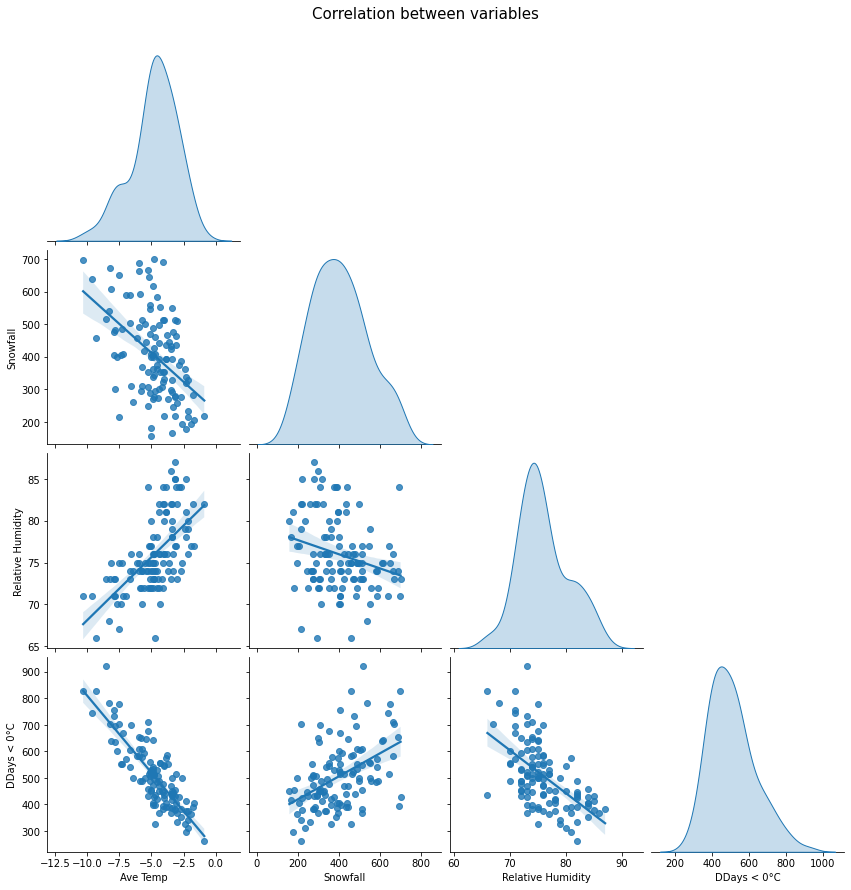

In [125]:
# Trying to observe potential correlations between different variables at seasonal observations

selected_df_winter = seasonal_data.loc[:,['Ave Temp', 'Snowfall', 'Relative Humidity', 'DDays < 0°C']]
sns.pairplot(selected_df_winter, 
             kind = 'reg', 
             diag_kind='kde', 
             height=3,
             corner=True
            )
plt.suptitle('Correlation between variables', y=1.03, fontsize=15)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_cor_var_years')

> Just by looking at the graphs, it appears that there is a approximately linear relationship between Average Temperature and Degree-days below freezing and between
Temperature and Relative Humidity. Both correlations seem reasonable: Lower temperature implies more degree-days below freezing and cold air can only hold less humidity than warm air. 
Other correlations between the variables are tougher to see at a first glance and might be less strong or simply not existant.

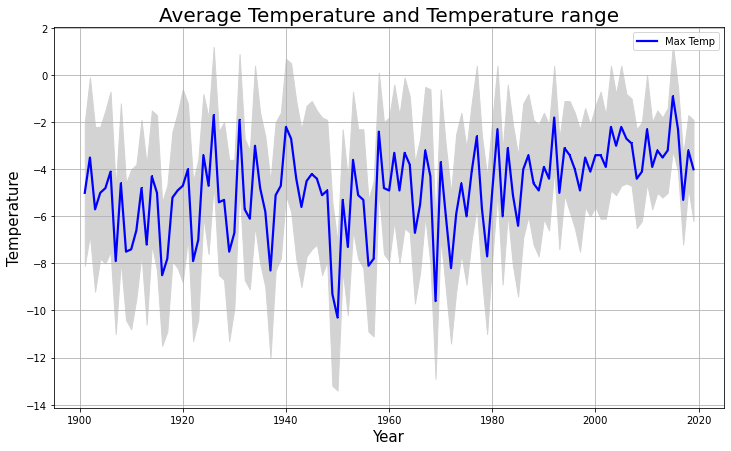

In [177]:
# Let's investigate how some variables change over time.
X  = np.linspace(0,3,200)
# Visualizing average, max, min winter termperatures over time
plt.figure(figsize = (12,7))

plt.plot('Year', 'Ave Temp', data=seasonal_data, linestyle='solid', marker=',', color='blue', lw=2.2)

# no need to plot max and min when shading the area in between lines
# plt.plot('Year', 'Max Temp', data=seasonal_data, linestyle='solid', marker=',', color='salmon')
# plt.plot('Year', 'Min Temp', data=seasonal_data, linestyle='solid', marker=',', color='salmon')

# Creating labels and the grid
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Temperature', fontsize = 15)
plt.legend(['Max Temp', 'Ave Temp', 'Min Temp'])
plt.title('Average Temperature and Temperature range', fontsize = 20)
plt.grid(True)

# filling the area between maximum and minimum temperature
plt.fill_between(seasonal_data['Year'],seasonal_data['Max Temp'],seasonal_data['Min Temp'], color='lightgrey')

# plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_max-min-temp')

> Over the years, minimum and maximum temperatures edge closer together. 
This phenomenon could be explained due to uncertainity in early temperature measurements or because of changing climatic conditions. 
However, the data also shows a slight but steady warming trend since around 1970.

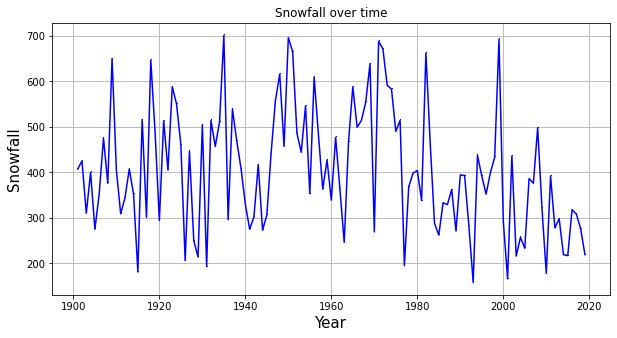

In [10]:
# Snowfall over time in the winter 

plt.figure(figsize = (10,5))
plt.plot(seasonal_data['Year'], 
         seasonal_data['Snowfall'], 
         linestyle='solid', 
         marker=',', color='blue')
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over time')
plt.grid(True)


> There is lots of *background noise* in the data, obstructing any clear major trends. It would be better to investigate with a fitting trendline perhaps

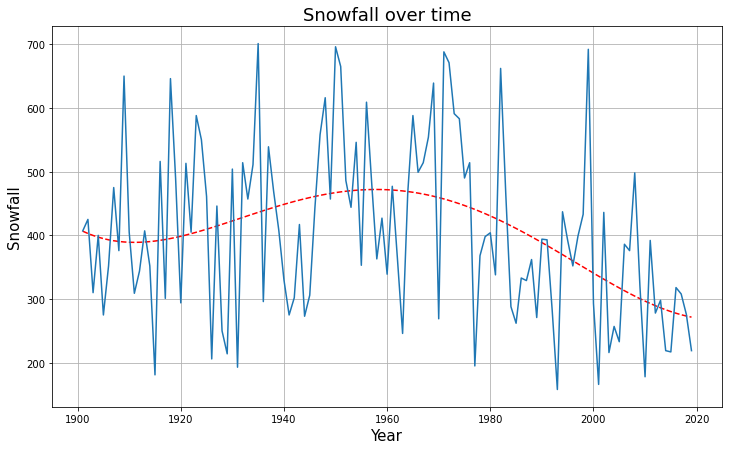

In [123]:
# Same graph with added trendline

X = np.array(seasonal_data['Year'])
Y = np.array(seasonal_data['Snowfall'])
fig, ax = plt.subplots(figsize = (12,7))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over time', fontsize = 18)
plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_years')

> The graph shows an increase in snowfall in the earlier records and a lower general snowfall level since about 1980. To fully understand recent trends it would be good to have continuing data into the future as it is not crystal clear yet.

### Monthly data

In [142]:
# Specifying the months of interest. The different lists of months serves to investigate the data from different perspectives.
winter_months_short = ['Jan', 'Feb']
winter_months = ['Dec', 'Jan', 'Feb']
winter_months_2 = ['Nov', 'Dec', 'Jan', 'Feb', 'Mar']
winter_months_3 = ['Oct','Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Apr']
# Using different months requires quick changes in the following graphs! 
# Some of them turn messy or simply don't work when dealing with too many months though.

# Merging the Month and the Year into one column
monthly_data_winter = monthly_data.loc[monthly_data['Month'].isin(winter_months_2)]
monthly_data_winter = monthly_data_winter.assign(Year_month = monthly_data_winter.Year.astype(str) + ' ' + monthly_data_winter.Month.astype(str))

monthly_data_winter

,Month,Year,Max Temp,Min Temp,Ave Temp,Precipitation,Radiation,DDays < 0°C,DDays > 5°C,DDays < 18°C,DDays > 18°C,Frost Free Days,Snowfall,Evaporation,Moisture Deficit,Relative Humidity,Year_month
0,Jan,1901,-3.4,-8.9,-6.2,206,-9999.0,210,1,750,0,1,161,0,0,76,1901 Jan
1,Feb,1901,-1.9,-8.7,-5.3,158,-9999.0,169,1,648,0,1,139,0,0,71,1901 Feb
2,Mar,1901,2.1,-6.1,-2.0,99,-9999.0,104,3,622,0,2,83,0,0,68,1901 Mar
10,Nov,1901,3.0,-3.3,-0.1,278,-9999.0,65,8,544,0,7,100,0,0,76,1901 Nov
11,Dec,1901,-0.6,-6.6,-3.6,177,-9999.0,137,2,665,0,3,108,0,0,75,1901 Dec
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1416,Jan,2019,0.4,-3.8,-1.7,151,-9999.0,99,4,612,0,6,57,0,0,83,2019 Jan
1417,Feb,2019,-4.4,-9.4,-6.9,24,-9999.0,209,0,694,0,1,23,0,0,78,2019 Feb
1418,Mar,2019,3.8,-4.5,-0.4,0,-9999.0,72,6,572,0,4,0,0,0,69,2019 Mar
1426,Nov,2019,2.8,-2.4,0.2,90,-9999.0,59,9,534,0,9,30,10,0,80,2019 Nov


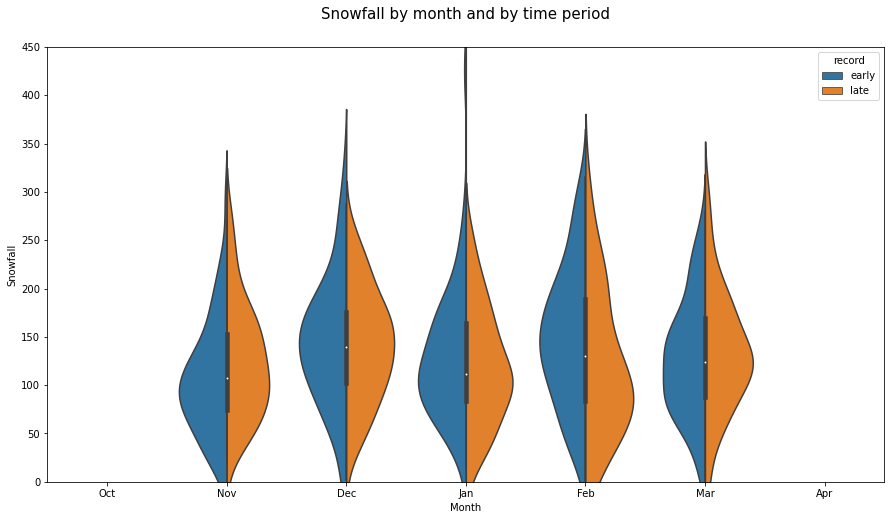

In [145]:
# Eplore what amounts of snowfall we're dealing with per month

# Adding a column to the monthly_data_winter dataframe to be able chornologically split data between 1901 and 2019 in half.
time_record = []
for year in monthly_data_winter['Year']:
    
    if year <= 1960:
        time_record.append('early')
    else:
        time_record.append('late')
time_record2 = np.array(time_record).T

monthly_data_winter = monthly_data_winter.assign(record = time_record2)

# Plotting the monthly snowfall
fig, ax = plt.subplots(figsize = (15,8))
snow_per_month = sns.violinplot(x='Month', 
                                y='Snowfall', 
                                data=monthly_data_winter,
                                order = ('Oct','Nov','Dec','Jan','Feb','Mar', 'Apr'),
                                hue = 'record',
                                split = True
                               
                               )
snow_per_month.set_ylim([0,450])
plt.title('Snowfall by month and by time period', y=1.05, fontsize=15)
# plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_months_violin_2')

> To better undestand the results of our data and which months to use for the *winter analysis*, it is useful to compare the snowfall over the months separately.
It turns out, that the violinplots are similarly shaped even in November and March in the early and late season. One of the more distinct shifts in Snowfall distribution happened in February where the majority of Snowfall amounts declined from about 150mm to 100mm across the two time periods

> Here the early and late records of the 20th (and early 21st) century don't vary much. Maybe there would be a difference when splitting the data in 3 or more subsets. 

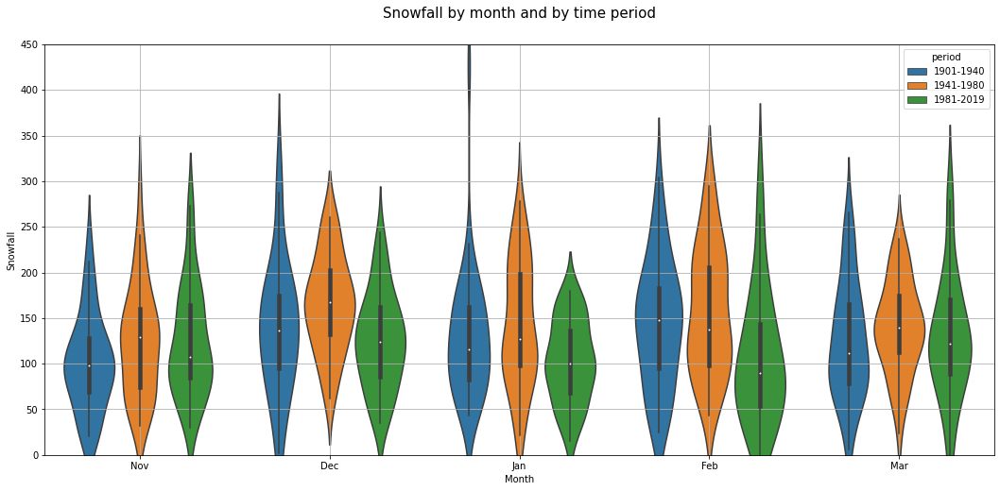

In [176]:
# Adding a column to the monthly_data_winter dataframe to be able chornologically split data between 1901 and 2019 in half.
time_record_3 = []
for year in monthly_data_winter['Year']:
    
    if year <= 1940:
        time_record_3.append('1901-1940'),
    elif year > 1940 and year <= 1980:
        time_record_3.append('1941-1980'),
    else:
        time_record_3.append('1981-2019')
         
time_record2 = np.array(time_record).T
monthly_data_winter = monthly_data_winter.assign(period = time_record_3)


# Plotting the monthly snowfall
fig, ax = plt.subplots(figsize = (18,8))
snow_per_month = sns.violinplot(x='Month', 
                                y='Snowfall', 
                                data=monthly_data_winter,
                                order = ('Nov','Dec','Jan','Feb','Mar'),
                                hue = 'period',
                               )

snow_per_month.set_ylim([0,450])
plt.title('Snowfall by month and by time period', y=1.05, fontsize=15)
plt.grid(True)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_months_violin_3')

> Generally, the distributions show that the mid-century time period (1941-1980) is characterized by higher snowfall averages than the other periods. The latest time period's distributions (1981-2019) show more lower snowfall levels. Again, the month of February stands out with lower snowfall levels in the later periods.

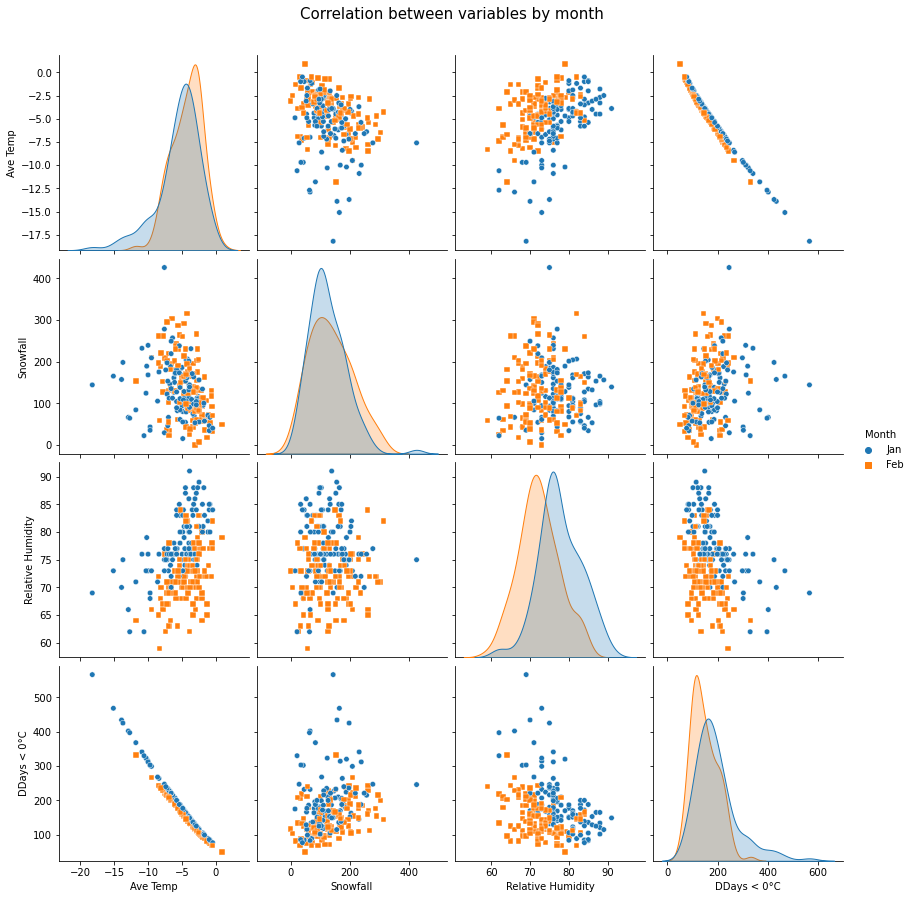

In [57]:
# Plotting correlations by month. Let's see if it changes from the seasonal data.

# Upper right corner different plot?
selected_df_winter_months = monthly_data_winter.loc[:,['Month','Ave Temp', 'Snowfall', 'Relative Humidity', 'DDays < 0°C']]
sns.pairplot(selected_df_winter_months, 
             kind = 'scatter', 
             diag_kind='kde', 
             height=3,
             markers=['o','s'], #,'D' for additional month
             plot_kws={'s':30},
             hue='Month'   # Using hue only really works for spectating a maximum of three months at a time. More months areoverwhelming.
) 
plt.suptitle('Correlation between variables by month', y=1.04, fontsize=15)

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_cor_var_month')

> This is rather difficult to read. Best for analyzing 2 months at a time, almost impossible for more than 3 months

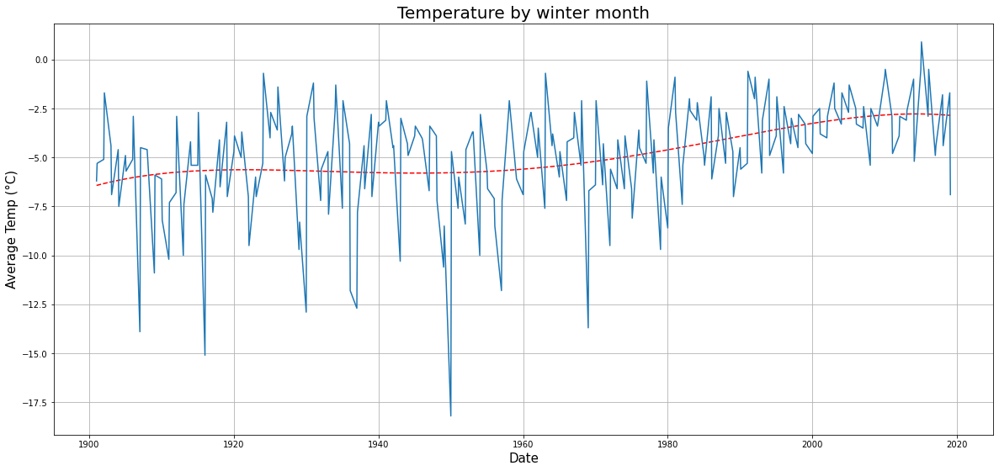

In [58]:
# plotting monthly variables and observations

# turn string into date format, then date to Matplotlib date numbers for the trendline
monthly_data_winter = monthly_data_winter.assign(Year_month2 = pd.to_datetime(monthly_data_winter['Year_month']).dt.date)
num_dates = mdates.date2num(monthly_data_winter['Year_month2'])

X = np.array(num_dates)
Y = np.array(monthly_data_winter['Ave Temp'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Average Temp (°C)', fontsize = 15)
plt.title('Temperature by winter month', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_temp_month')

> The internal variation with the monthly scale seems almost overwhelming, but the trendline helps. The more recent trend show slight warming again

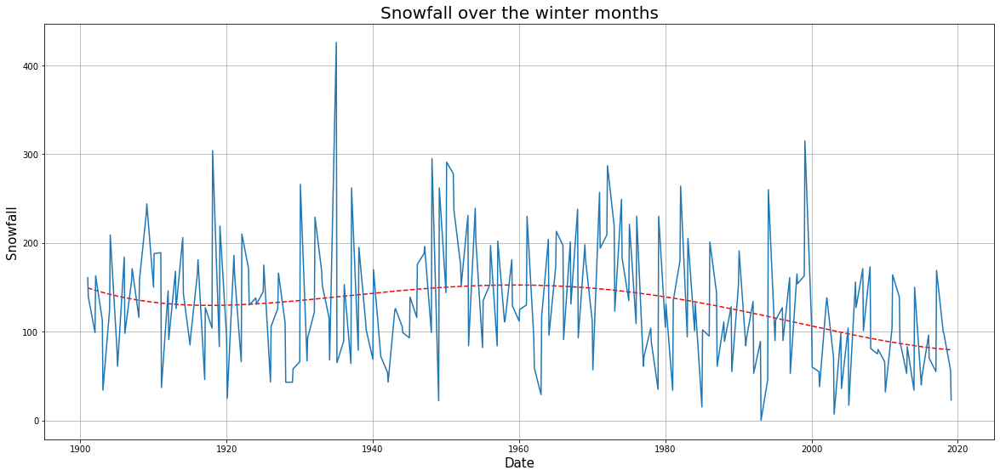

In [59]:
# Snowfall in single winter months

# Create plot
X = np.array(num_dates)
Y = np.array(monthly_data_winter['Snowfall'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Snowfall', fontsize = 15)
plt.title('Snowfall over the winter months', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_snow_months')

> It can be argued that there is an upwards trend in snowfall in the early 1900s and a downwards trend since the 1970s.

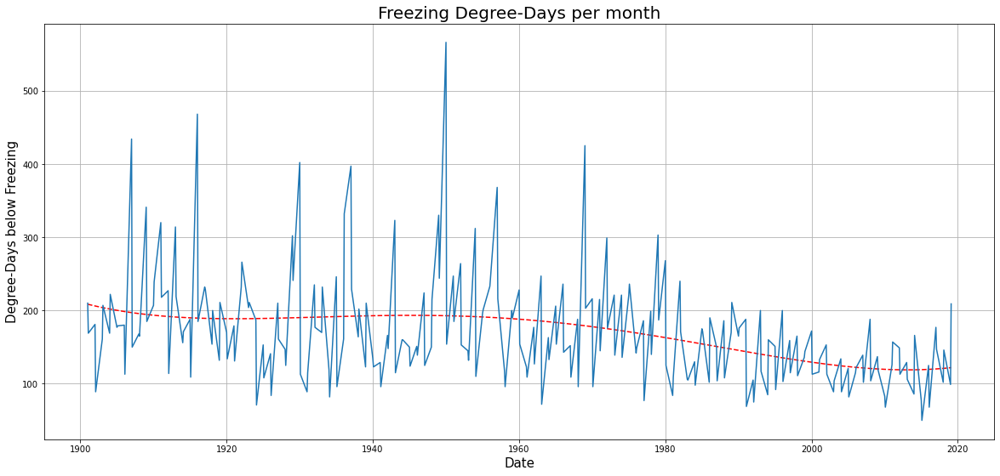

In [61]:
# Again, redefining the months since this graph becomes particularly messy with too many months. 
# Right now: only working with January and February

# Merging the Month and the Year into one column
monthly_data_winter = monthly_data.loc[monthly_data['Month'].isin(winter_months_short)]
monthly_data_winter = monthly_data_winter.assign(Year_month = monthly_data_winter.Year.astype(str) + ' ' + monthly_data_winter.Month.astype(str))

# Turn string into date format, then date to Matplotlib date numbers for the trendline
monthly_data_winter = monthly_data_winter.assign(Year_month2 = pd.to_datetime(monthly_data_winter['Year_month']).dt.date)
num_dates = mdates.date2num(monthly_data_winter['Year_month2'])

# Create plot
X = np.array(num_dates)
Y = np.array(monthly_data_winter['DDays < 0°C'])
fig, ax = plt.subplots(figsize = (20,9))
np.shape(X)
np.shape(Y)
Z = np.polyfit(X, Y, 4)
ZZ = np.poly1d(Z)
ax.plot(X, ZZ(X),'r--')
ax.plot(X, Y)
plt.xlabel('Date', fontsize = 15)
plt.ylabel('Degree-Days below Freezing', fontsize = 15)
plt.title('Freezing Degree-Days per month', fontsize = 20)
plt.grid(True)

# Show X-axis major tick marks as dates
loc = mdates.AutoDateLocator()
plt.gca().xaxis.set_major_locator(loc)
plt.gca().xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
plt.gcf().autofmt_xdate

plt.savefig(r'C:\Users\Len\Documents\GitHub\solo_502\course-project-solo_502/images/Whistler_DD0_months')

> The amplitude of the data certainly decreases since the 1960s. Again, this might be due to more precise measurements in recent data. 
Similarly to the snowfall data, there seems to be a downwards trend in recent years since the 1970s. 

In [129]:
### Looking at it through a correlation matrix

# corr = monthly_data_winter.corr()
# fig, ax = plt.subplots(figsize = (20,20))
# sns.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, 
#             annot = True, cmap = sns.diverging_palette(220, 20, as_cmap=True))


# To do

- import function from...
- add other locations
- edit/clean README's
- put To do into README
- go through code and explanatory descriptions (#comments)
- comments: min-max range is getting smaller -> no mistake, that's climate change (especially whistler)



# Conclusions

#### As mentioned, this notebook, the comments and conclusion only cover the data from Whister in British Columbia

- Several graphs show the expected trends since around the 1970s. There is a slight increase in average temperature while snowfall and degree-days below freezing decline. The average temperature even rose by a few degrees Celsius in the investigated time period. From a climatic standpoint, that is a very big margin. 
- Snowfall is also experiencing a substantial decline in the last decades, dipping from close to 200mm to the lower 100s level.
- When dividing the entire record period (1901-2019) into two halves, there is no great change in monthly snowfall to be observed.
- When comparing these results to climate change research, it is noticeable that the trends acutally are consistent with climatic responses on a bigger scale.
- Even the trends from ealier record fit the general climatic trends on earch: Global temperatures were stagnating between 1940 and 1970 before they resumed their steep rise in the 1970s. I will emphasize and elaborate this in my literlature review and finishing paper
- Important note: Analysis from 1 or 10 ski resorts aren't very conclusive. With this data, it is possible to determine if the data agrees with general climatic developments. One big problem of climatology is that the individual event or trend can (almost) never be entirely contributed to a specific cause. Climate responses and dynamics are very complicated, hence I will not draw any bigger conclusions from my data (yet). After analyzing all the ski resorts that I'm hoping to get to, I will answer the questions if there is a general difference between continental and pacific ski resort locations.

- Methods: line plots vs other plots. In climatic analysis, line plots are everything. Often, is less about determining potential correlations between some variables since there are an incredible amount of variables involved and huge datasets are required for a meaningful analysis. With the lineplots however, trends in climatic records can be found and shown.
- Further comments: It could be good to smooth out the data before plotting it for some of the monthly data plots